## Task 1: Create simulation

In [1]:
import matplotlib.pyplot as plt
import numpy as np

class BacteriaGrowthSimulation:
    """
    A class to simulate bacteria growth and food consumption in a 2D grid environment.

    Parameters
    ----------
    consumption_rate : float
        The rate at which bacteria consume food.
    food_growth_rate : float
        The rate at which food grows in each grid cell.
    diffusion_rate : float
        The rate at which food diffuses across grid cells.
    bacteria_diffusion_rate : float
        The rate at which bacteria diffuse across grid cells.
    bacteria_growth_rate : float
        The growth rate of bacteria.
    bacteria_max : float
        The maximum population size of bacteria per grid cell.
    size : int, optional
        The size of the grid, by default 100.
    min_food : int, optional
        The minimum amount of food in a grid cell, by default 0.
    max_food : int, optional
        The maximum amount of food in a grid cell, by default 100.

    Attributes
    ----------
    food_state : np.ndarray
        2D grid representing the current state of food across the grid.
    bacterial_state : np.ndarray
        2D grid representing the current state of bacteria across the grid.
    average_bacteria_population : list
        Keeps track of the average bacterial population per iteration.
    average_food_population : list
        Keeps track of the average food available per iteration.
    step_counter : int
        Counter to keep track of the number of steps/iterations of the simulation.
    """
    def __init__(self, 
                 consumption_rate, 
                 food_growth_rate, 
                 diffusion_rate,
                 bacteria_diffusion_rate,
                 bacteria_growth_rate,
                 bacteria_max,
                 size=100, 
                 min_food = 0, 
                 max_food = 100):
        """
        Initialises an instance of the class.
        """
        self.size = size
        self.consumption_rate = consumption_rate
        self.diffusion_rate = diffusion_rate
        self.bacteria_diffusion_rate = bacteria_diffusion_rate
        self.bacteria_growth_rate = bacteria_growth_rate
        self.food_growth_rate = food_growth_rate
        self.bacteria_max = bacteria_max
        self.min_food = min_food
        self.max_food = max_food
        self.food_state = np.zeros((size, size))
        self.bacterial_state = np.zeros((size, size))
        self.average_bacteria_population = []
        self.average_food_population = []
        self.step_counter = 0

    def initialize(self, food_density=0.6, bacteria_density = 0.5):
        """
        Initializes the grids for food and bacteria.

        Parameters
        ----------
        food_density : float, optional
            The initial density of food in the grid, by default 0.1.
        bacteria_density : float, optional
            The initial density of bacteria in the grid, by default 0.5.
        """
        
        # Food grid
        # randomly selecting the cells to fill with food
        food_indexes = np.random.choice(
            range(self.size ** 2),
            size=int(round(food_density * self.size ** 2)),
            replace=False)
        # initializing food amount for every randomly selected cell
        food_amount = np.random.uniform(self.min_food, self.max_food, food_indexes.shape[0])
        self.food_state.flat[food_indexes] = food_amount
        
        # Bacteria grid
        # initializing the number of bacteria for every cell with food as a function of the
        # amount of food available using consumption_rate
        bacteria_indexes = np.random.choice(
            range(self.size ** 2),
            size=int(round(bacteria_density * self.size ** 2)),
            replace=False)
        # initializing food amount for every randomly selected cell
        bacteria_amount = np.random.uniform(0, self.bacteria_max, bacteria_indexes.shape[0]).astype(int) 
        self.bacterial_state.flat[bacteria_indexes] = bacteria_amount

    def update(self):
        """
        Updates the state of the food and bacteria grids according to the specified
        model rules, and increments the step counter.
        """
        
        # Food Growth
        # max_food = kf
        food_growth = self.food_state*(1+ self.food_growth_rate*(1 - self.food_state/self.max_food))
        self.food_state += food_growth
        
        # Food Reseeding
        reseeding_matrix = np.random.rand(*self.food_state.shape)
        # creating a mask where each cell is True with probability `reseed_probability`
        reseed_mask = reseeding_matrix < 0.01
        # adding 1 unit of food to the cells identified by the mask
        self.food_state[reseed_mask] += 1
        
        # Food Diffusion
        food_diffusion = self.diffusion_rate * self.food_state 
        net_food_diffusion = np.zeros_like(self.food_state)

        # going through every cell in the food grid
        for i in range(self.size):
            for j in range(self.size):
                # subtracting the lost food
                net_food_diffusion[i, j] -= food_diffusion[i, j]
                
                for dx, dy in [(0, -1), (0, 1), (-1, 0), (1, 0)]:
                    ni, nj = (i + dx) % self.size, (j + dy) % self.size
                    net_food_diffusion[ni, nj] += 0.25 * food_diffusion[i, j]
        
        # if the food amount exceeds the limits, we set it to the nearest limit
        self.food_state = np.clip(self.food_state + net_food_diffusion, self.min_food, self.max_food)
        
        # Consumption
        food_required = self.consumption_rate * self.bacterial_state
        food_consumed = np.minimum(food_required, self.food_state)
        self.food_state -= food_consumed
        
        # Death & Reproduction
        survived_bacteria = food_consumed // self.consumption_rate
        # basing the calculation on only the survived bacteria
        # disregarding the dead bacteria
        self.bacterial_state = survived_bacteria * (1 + self.bacteria_growth_rate)
        
        # Bacteria Diffusion
        bacteria_diffusion = self.bacteria_diffusion_rate * self.bacterial_state
        net_bacteria_diffusion = np.zeros_like(self.bacterial_state)
        
        # going through every cell in the food grid
        for i in range(self.size):
            for j in range(self.size):
                # subtracting the lost food
                net_bacteria_diffusion[i, j] -= bacteria_diffusion[i, j]
                
                for dx, dy in [(0, -1), (0, 1), (-1, 0), (1, 0)]:
                    ni, nj = (i + dx) % self.size, (j + dy) % self.size 
                    net_bacteria_diffusion[ni, nj] += 0.25 * bacteria_diffusion[i, j]
        
        self.bacterial_state += net_bacteria_diffusion
        self.average_bacteria_population.append(np.mean(self.bacterial_state))
        self.average_food_population.append(np.mean(self.food_state))
        self.step_counter += 1
    
    def observe_bacteria(self,axs):
        """
        Visualizes the current bacterial state on a provided AxesSubplot.

        Parameters
        ----------
        axs : matplotlib.axes.Axes
            The AxesSubplot where the bacteria grid should be visualized.

        Returns
        -------
        plot_bacteria : matplotlib.image.AxesImage
            The image object produced, useful for further customization or colorbar addition.
        """
        plot_bacteria = axs[0].imshow(
            self.bacterial_state, vmin=0, vmax=1, cmap = 'Greys')
        axs[0].set_title(f'Bacterial state at step {self.step_counter},{round(np.mean(self.bacterial_state), 2)} ')
        return plot_bacteria
    
    def observe_food(self,axs):
        """
        Visualizes the current food state on a provided AxesSubplot.

        Parameters
        ----------
        axs : matplotlib.axes.Axes
            The AxesSubplot where the food grid should be visualized.

        Returns
        -------
        plot_food : matplotlib.image.AxesImage
            The image object produced, useful for further customization or colorbar addition.
        """
        plot_food = axs[1].imshow(
        self.food_state,vmin = 0,vmax = 1,cmap = "Greys")
        axs[1].set_title(f'Food state at step {self.step_counter}, {round(np.mean(self.food_state), 2)}')
        return plot_food

In [2]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from tqdm import tqdm
import matplotlib.pyplot as plt

def make_animation(sim, total_frames, steps_per_frame=1, interval=100):
    """
    Create an animated visualization of the bacteria growth and food consumption 
    simulation using Matplotlib.

    This function will produce an animation of the state of the bacteria and food 
    grids over a specified number of frames, where each frame represents an update 
    step of the simulation. The simulation (`sim` parameter) should have methods 
    for initialization (`initialize`), updating (`update`), and visualization 
    (`observe_bacteria` and `observe_food`).

    Parameters
    ----------
    sim : BacteriaGrowthSimulation
        An instance of a bacteria growth and food consumption simulation.
    total_frames : int
        The total number of frames in the animation.
    steps_per_frame : int, optional
        The number of simulation update steps per animation frame, by default 1.
    interval : int, optional
        Time between frames in milliseconds, by default 100.

    Returns
    -------
    output : IPython.display.HTML
        HTML5 video embed code for IPython Notebook.
    """
    fig, axs = plt.subplots(1, 2, figsize=(7, 4))
    progress_bar = tqdm(total=total_frames * steps_per_frame)
    sim.initialize()
    
    def update(frame_number):
        """
        Update the simulation and the animation frames.

        This function will perform a specified number of simulation updates 
        per animation frame and update the visualization accordingly. 
        The updated visualization includes both the bacteria and food states.

        Parameters
        ----------
        frame_number : int
            The current frame number in the animation sequence. 
            It's provided by FuncAnimation.

        Returns
        -------
        list
            A list containing the visual updates for the bacteria and food states,
            which will be rendered in the animation.
        """
        for _ in range(steps_per_frame):
            sim.update()
            progress_bar.update(1)
        return [sim.observe_bacteria(axs),sim.observe_food(axs)]

    animation = FuncAnimation(
        fig, update, init_func=lambda: [], frames=total_frames, interval=interval)
    output = HTML(animation.to_html5_video())
    plt.close(fig)
    return output

### Average food and bacteria cell population

In the code cell below, I am initialising the simulation and running it for "num_steps" number of time steps to see how the average bacteria and food cell population changes. The average cell population is calculated within the "BacteriaGrowthSimulation" class itself using np.mean() function. Specifically, each timestep the the mean cel population calculated via np.mean() is recorded and stored. <br><br> In the code cell below, I run the simulation for 8000 steps and access the recorded averages over 8000 time steps.

In [28]:
# setting parameters
cr, fg, dr, bdr, bgr = 0.5, 0.15, 0.1, 0.1, 1
num_steps = 2000

sim = BacteriaGrowthSimulation(consumption_rate = cr, 
                               food_growth_rate = fg, 
                               diffusion_rate = dr,
                               bacteria_diffusion_rate = bdr,
                               bacteria_growth_rate = bgr,
                               size=100, 
                               min_food = 0, 
                               max_food = 100, 
                               bacteria_max=500)
sim.initialize()
avg_food = []
avg_bacteria = []

# running the simulation for num_steps steps
for _ in range(num_steps):
    sim.update()

# storing the average cell population per each step over "num_steps"
# number of steps
avg_food.append(sim.average_food_population)
avg_bacteria.append(sim.average_bacteria_population)

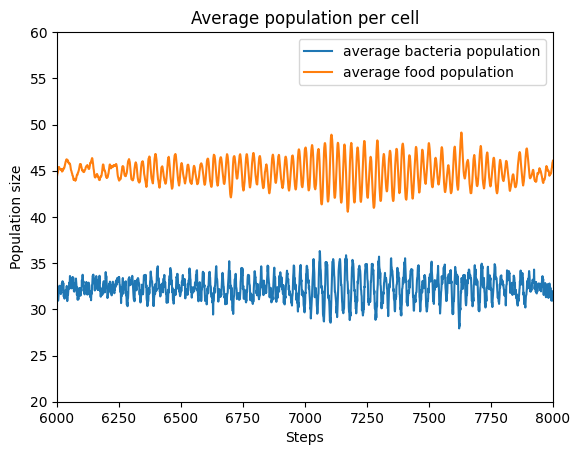

In [5]:
# Plotting the mean bacteria and food cell populations
x_axis = np.linspace(0,num_steps,num_steps)
plt.figure()
plt.plot(x_axis, np.squeeze(avg_bacteria), label = "average bacteria population")
plt.plot(x_axis, np.squeeze(avg_food), label = "average food population")
plt.xlim(6000, 8000)
plt.ylim(20, 60)
plt.legend()
plt.xlabel("Steps")
plt.ylabel("Population size")
plt.title("Average population per cell")
plt.show()

The plot above showcases the change in the average food/bacteria cell population as the number of time steps increases. The graphs oscillating arount one value indicate that the simulation is aroud its equilibrium. I restricted the size of the plot to be between 6000 and 8000 so that the changes are seen more clearly and the scale is more intelligible.

In the code cell below, I am plotting the same plot as above but I am not restricting the x axis to show when the variables start to converge around the target value. 

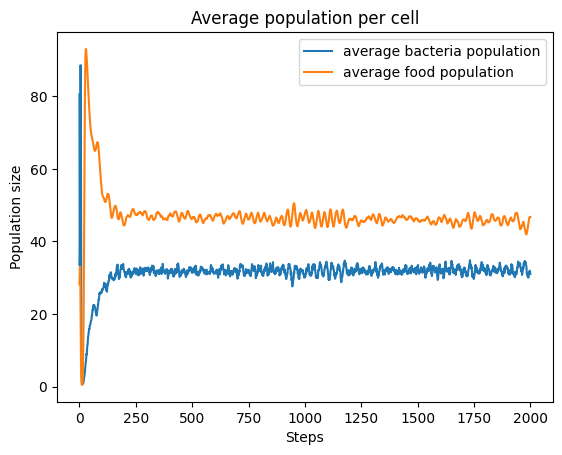

In [29]:
# Plotting the mean bacteria and food cell populations
num_steps = 2000
x_axis = np.linspace(0,num_steps,num_steps)
plt.figure()
plt.plot(x_axis, np.squeeze(avg_bacteria), label = "average bacteria population")
plt.plot(x_axis, np.squeeze(avg_food), label = "average food population")
plt.legend()
plt.xlabel("Steps")
plt.ylabel("Population size")
plt.title("Average population per cell")
plt.show()

### Test Case 1: Animation

Below I am running the simulation for 2000 steps and creating a visualisation for each one of the steps. I could not run the simulation for longer for this visualisation because it took me around 4 hours and 30 minutes to run it for 2000 steps.

In [26]:
cr, fg, dr, bdr, bgr = 0.5, 0.15, 0.1, 0.1, 1
num_steps = 700
sim = BacteriaGrowthSimulation(consumption_rate = cr, 
                 food_growth_rate = fg, 
                 diffusion_rate = dr,
                 bacteria_diffusion_rate = bdr,
                 bacteria_growth_rate = bgr,
                 bacteria_max = 500,
                 size=100, 
                 min_food = 0, 
                 max_food = 100)
make_animation(sim, total_frames=num_steps, steps_per_frame=1)

100%|█████████████████████████████████████████| 700/700 [43:59<00:00,  3.77s/it]


## Task 2: Empirical Analysis

In [8]:
def empirical_analyses(parameter_values, 
                       parameter_to_change, 
                       fixed_parameters, 
                       num_steps):
    """
    Varies a single parameter across a specified range, while keeping other parameters fixed.

    For each parameter value, the function runs a simulation and calculates average food 
    and bacteria populations over the specified number of steps.

    Parameters:
    -----------
    parameter_values : list or iterable
        A list or an iterable of parameter values to be used in the simulation, 
        representing different levels of the parameter to investigate.

    parameter_to_change : str
        The name of the parameter to be varied across simulations. 
        Should match one of the parameter names used in BacteriaGrowthSimulation.

    fixed_parameters : dict
        A dictionary containing parameter names (str) and their corresponding fixed values.
        These parameters remain constant across all simulations.

    num_steps : int
        The number of steps to run each simulation. Each simulation is initialized,
        then updated this many times.

    Returns:
    --------
    results_df : pandas.DataFrame
        A DataFrame containing the varied parameter, the average food population, 
        and the average bacteria population for each simulation, along with the fixed 
        parameters. Each row corresponds to one level of the varied parameter, and 
        columns correspond to:
            - The varied parameter name and its values
            - 'avg_food': Mean food population across simulation steps
            - 'avg_bacteria': Mean bacteria population across simulation steps
    """
    results = []
    # iterating through different parameter values
    for param_value in param_values:
        average_over_trials_food = []
        average_over_trials_bacteria = []
        params = fixed_parameters.copy()
        # only changing the chosen parameter
        params[parameter_to_change] = param_value
        # initiating the simulation with the new parameters
        sim = BacteriaGrowthSimulation(**params, bacteria_max = 500)
        sim.initialize()

        for _ in range(num_steps):
            sim.update()

        # Store the results
        avg_food = sim.average_food_population # every step average
        avg_bacteria = sim.average_bacteria_population
        
        # storing the results in a disctionary with a parameter name that was altered
        result_dict = {
            parameter_to_change: param_value,
            "avg_food": np.mean(np.array(avg_food)),
            "avg_bacteria": np.mean(np.array(avg_bacteria))
        }
        result_dict.update(fixed_params)
        results.append(result_dict)
                    
    results_df = pd.DataFrame(results)
    return results_df

Code cell below runs the empirical analysis function for every parameter I want to change and returns a dictionary of panda dataframes corresponding to each parameter that was changed.

In [13]:
# Setting the parameters to the ones used in the simulations above
#consumption_rate, food_growth_rate, diffusion_rate, bacteria_diffusion_rate, bacteria_growth_rate = 0.5, 0.15, 0.1, 0.1, 1
import pandas as pd
fixed_params = {
    "consumption_rate": 0.5,
    "food_growth_rate": 0.15,
    "diffusion_rate": 0.1,
    "bacteria_diffusion_rate": 0.1,
    "bacteria_growth_rate": 1
}
# add bacteria and food initial density
param_values = np.linspace(0.1, 1, 30)
parameter_names = ['consumption_rate', 
                   'food_growth_rate', 
                   'diffusion_rate', 
                   'bacteria_diffusion_rate', 
                   'bacteria_growth_rate']
NUM_STEPS = 2000

results_parameters = {}
for name in parameter_names:
    results_parameters[name] = empirical_analyses(parameter_values = param_values, 
                                                                 parameter_to_change = name, 
                                                                 fixed_parameters = fixed_params, 
                                                                 num_steps = NUM_STEPS)

In [14]:
# accessing the separate panda dataframes
consumption = results_parameters["consumption_rate"]
food_growth_rate = results_parameters["food_growth_rate"]
bacteria_growth_rate = results_parameters["bacteria_growth_rate"]

Now that we ran the simulation for a sufficiently large number of times, we can plot the results.

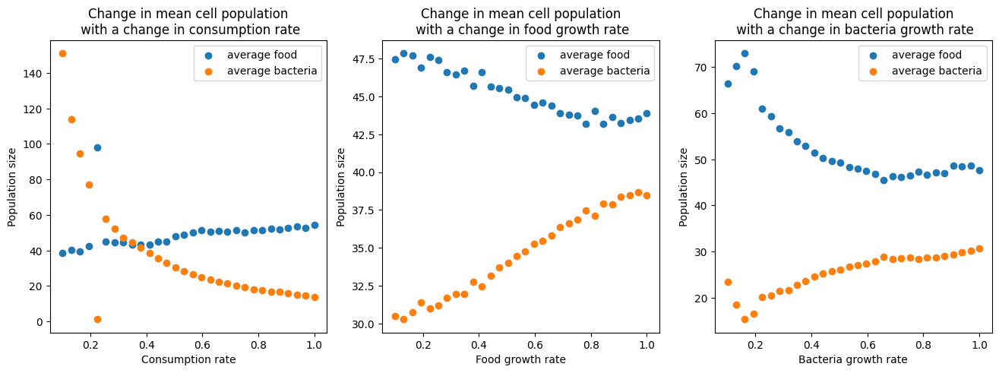

In [19]:
# Plotting the results with varying parameters
x_axis = param_values
average_food = results_parameters["consumption_rate"]['avg_food']
average_bacteria = average_food = results_parameters["consumption_rate"]['avg_bacteria']

# Consumption rate
fig, axs = plt.subplots(1, 3, figsize=(16, 5)) 
axs[0].scatter(x_axis, consumption["avg_food"], label = "average food")
axs[0].scatter(x_axis, consumption["avg_bacteria"], label = "average bacteria")
axs[0].set_title("Change in mean cell population\n with a change in consumption rate")
axs[0].set_xlabel("Consumption rate")
axs[0].set_ylabel("Population size")
axs[0].legend()

# Food growth rate
axs[1].scatter(x_axis, food_growth_rate['avg_food'], label = "average food")
axs[1].scatter(x_axis, food_growth_rate["avg_bacteria"], label = "average bacteria")
axs[1].set_title("Change in mean cell population\n with a change in food growth rate")
axs[1].set_xlabel("Food growth rate")
axs[1].set_ylabel("Population size")
axs[1].legend()

# Bacteria growth rate
axs[2].scatter(x_axis, bacteria_growth_rate["avg_food"], label = "average food")
axs[2].scatter(x_axis, bacteria_growth_rate["avg_bacteria"], label = "average bacteria")
axs[2].set_title("Change in mean cell population\n with a change in bacteria growth rate")
axs[2].set_xlabel("Bacteria growth rate")
axs[2].set_ylabel("Population size")
axs[2].legend()
plt.show()

## Task 3: Theoretical Analyses

Looking at the first plot above, we see that the mean bacteria cell population follows an exponential decay pattern as the consumption rate increases. I am exploring this idea in the next code cell by fitting an exponential function to the data I simulated and comparing the results.

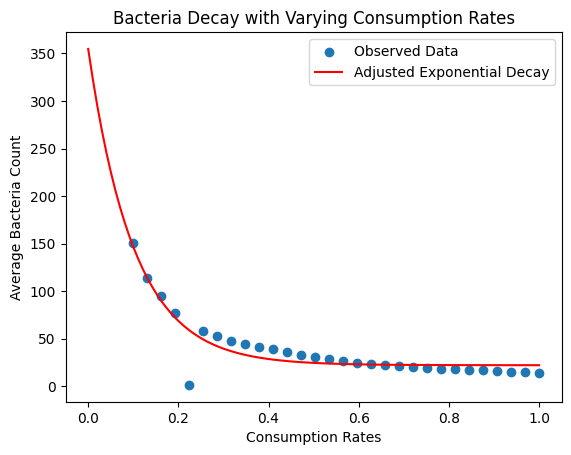

Adjusted b_t: 332.786
Adjusted Decay Rate: 9.828
Adjusted y-offset: 21.999


In [24]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

def decay_model(t, bt, decay_rate, y_offset):
    """
    Model an exponential decay function.

    Parameters
    ----------
    t : array_like
        The independent variable (time or analogous parameter) over which decay occurs.
    A : float
        The initial quantity at t=0.
    decay_rate : float
        The positive rate at which the quantity A decays over time t.
    y_offset : float
        The horizontal asymptote, or the limiting value of the function as t approaches infinity.

    Returns
    -------
    array_like
        The dependent variable representing the quantity at time t, after applying the exponential decay.
    """
    return bt * np.exp(-decay_rate * t) + y_offset

# using the same parameters as in the functions above
consumption_vals = param_values
# the simulated values
avg_bacteria_vals = consumption["avg_bacteria"]

# storing the coefficients
coefficients, _ = curve_fit(decay_model, consumption_vals, avg_bacteria_vals)
A, decay_rate, y_offset = coefficients

t_fit = np.linspace(0, 1, 100)
bacteria_fit = decay_model(t_fit, A, decay_rate, y_offset)

plt.scatter(consumption_vals, avg_bacteria_vals, label='Observed Data')
plt.plot(t_fit, bacteria_fit, label='Adjusted Exponential Decay', color='red')
plt.xlabel('Consumption Rates')
plt.ylabel('Average Bacteria Count')
plt.legend(loc='upper right')
plt.title('Bacteria Decay with Varying Consumption Rates')
plt.show()

print(f"Adjusted b_t: {A:.3f}")
print(f"Adjusted Decay Rate: {decay_rate:.3f}")
print(f"Adjusted y-offset: {y_offset:.3f}")

### Optional task: Code Implementation

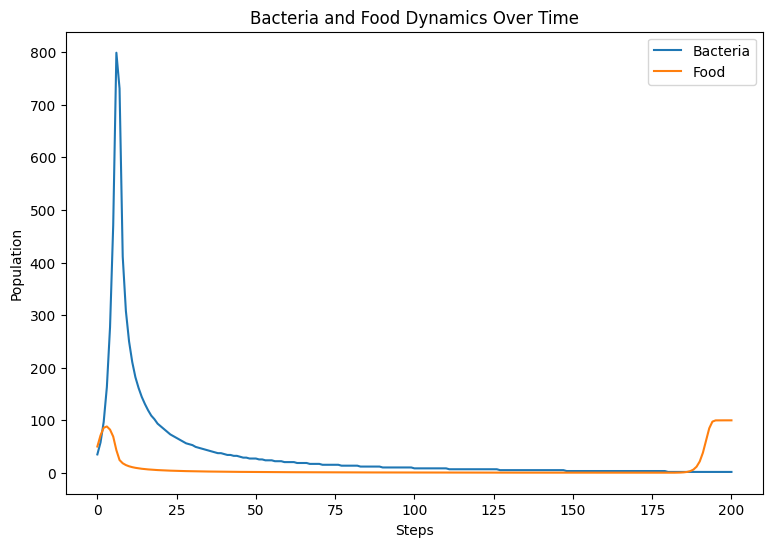

In [30]:
import matplotlib.pyplot as plt
import numpy as np

def simulate_bacteria_food_dynamics(initial_b, initial_f, cb, gb, gf, kf, steps):
    """
    Simulate and visualize the dynamics of bacteria and food populations over discrete time steps.
    
    This function models the interaction of bacteria and food over time, updating their states
    at each step based on predefined relationships and plotting the results. 
    
    Parameters:
    -----------
    initial_b : float
        Initial size of the bacteria population.
    initial_f : float
        Initial size of the food population.
    cb : float
        Consumption rate of bacteria, indicating how much food is consumed by the bacteria per time step.
    gb : float
        Growth rate of the bacteria, affecting how much the bacteria population increases per time step, given sufficient food.
    gf : float
        Growth rate of the food, determining how much the food population increases per time step.
    kf : float
        Maximum food capacity, affecting the food growth rate by limiting it as it approaches kf.
    steps : int
        The number of time steps to simulate and plot.
    
    Returns:
    --------
    None
        The function does not return any values. It directly plots the population dynamics.
    """
    
    bt = initial_b  # initial bacteria state
    ft = initial_f  # initial food state
    
    # Lists to store the state of bacteria and food at each step for plotting
    bacteria_states = [bt]
    food_states = [ft]
    
    for _ in range(steps):
        # Calculating next states using provided formulas
        ft_next = (ft * (1 + (gf * (1 - (ft / kf))))) - min(cb * bt, ft)
        bt_next = (min(cb * bt, ft)//cb)*(1+gb)
        # Updating the states
        bt, ft = bt_next, ft_next
        
        # Storing the updated states
        bacteria_states.append(bt)
        food_states.append(ft)
    
    # Plotting
    plt.figure(figsize=(9, 6))
    plt.plot(bacteria_states, label='Bacteria')
    plt.plot(food_states, label='Food')
    plt.xlabel('Steps')
    plt.ylabel('Population')
    plt.legend()
    plt.title('Bacteria and Food Dynamics Over Time')
    plt.show()

# Example usage of the function
simulate_bacteria_food_dynamics(
    initial_b=35, 
    initial_f=50, 
    cb=0.1, 
    gb=0.7, 
    gf=0.99, 
    kf=100, 
    steps=200
)